# Exercise 1:
Create a dataset from 50 Wikipedia articles. The articles should cover several topics, such as
Science, Politics, Nature, Sport, and Fashion.
Copy the text in each article into a text file with the name in the following format: ID - Article
title.txt. For example, 1 - Donald Trump.txt.
Put the files in a folder named Data
Zip the folder to Data.zip


In [1]:
# Import necessary libraries.
import zipfile
import os
import pandas as pd

In [22]:
# Define file paths.
zip_file = r'C:\Users\HP\Problem-Set-03---NLP\Data.zip'
unzip_folder = r'C:\Users\HP\Problem-Set-03---NLP\Data'

# Unzip 'Data' file.
with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(unzip_folder)

# Specify the path to the extracted 'Data' folder.
data_folder = os.path.join(unzip_folder, 'Data')

# Read file paths of text files.
file_paths = [os.path.join(data_folder, file) for file in os.listdir(data_folder) if file.endswith('.txt')]

# Print to check.
print(f"Found {len(file_paths)} text files.")
print(file_paths)

Found 50 text files.
['C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\1 - Hot Wheels.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\10 - Lionel Messi.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\11 - Uniqlo.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\12 - Natural Language Processing.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\13 - Donald Trump.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\14 - Jurassic.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\15 - Pickleball.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\16 - Fashion.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\17 - Particle Accelerator.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\18 - Joe Biden.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\19 - Capybara.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\2 - Wankel Engine.txt', 'C:\\Users\\HP\\Problem-Set-03---NLP\\Data\\Data\\20 - Toyota Supra.txt', 'C:\\Users\\HP\\Prob

# Exercise 2:
Write the code to compute the term-document matrix. Compute the term-document matrix for
the dataset. Save the term-document matrix to a .csv file named TD.csv.



In [23]:
# Read the content of text files.
documents = []
for file_path in file_paths:
    with open(file_path, 'r', encoding='utf-8') as file:
        documents.append(file.read())

# Print first 400 characters of the first document to check.
print(documents[0][:400])

Hot Wheels is an American media franchise and brand of scale model cars invented by Elliot Handler and introduced by his company Mattel on May 18, 1968.[2] It was the primary competitor of Matchbox until Mattel bought Matchbox owner Tyco Toys in 1997.

Many automobile manufacturers have since licensed Hot Wheels to make scale models of their cars, allowing the use of original design blueprints and


In [25]:
# Import CountVectorizer for term-document computation.
from sklearn.feature_extraction.text import CountVectorizer # type: ignore


# Compute the term-document matrix (term frequencies)
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(documents)

# Get the terms and convert the matrix to array.
terms = vectorizer.get_feature_names_out()
td_matrix = X.toarray()

# Show the shape of the matrix.
print(f"Term-Document Matrix shape: {td_matrix.shape}")

# Print the term-document matrix.
print(td_matrix)

# Print from 2000 to avoid numeric characters.
print(terms[2000:])

Term-Document Matrix shape: (50, 25742)
[[ 0  2  0 ...  0  0  0]
 [ 0  2  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  2  0 ...  0  0  0]
 [ 0 22  0 ...  0  0  0]
 [ 8 13  0 ...  0  0  0]]
['aimar' 'aimed' 'aiming' ... '짬뽕' '칼국수' '𠊛越']


In [26]:
# Create a dataframe for the term-document matrix.
df = pd.DataFrame(td_matrix, columns=terms, index=[os.path.basename(path) for path in file_paths])

# Save to a CSV file.
csv_file = r'C:\Users\HP\Problem-Set-03---NLP\TD.csv'
df.to_csv(csv_file, index=True)

# Print to check file path.
print(f"Term-Document Matrix saved to {csv_file}")

Term-Document Matrix saved to C:\Users\HP\Problem-Set-03---NLP\TD.csv


# Exercise 3:
Write the code to compute the tf-idf for each term in the vocabulary. Computer the tf-idf for all
terms in the dataset. Export tf-idf to TF-IDF.csv


In [28]:
# Import TfidfVectorizer to compute TF-IDF.
from sklearn.feature_extraction.text import TfidfVectorizer

# Calculate TF-IDF.
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(documents)
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())

# Adjust output for full display.
pd.set_option('display.max_columns', None)  # Show all columns.
pd.set_option('display.expand_frame_repr', False)  # Prevent line wrapping.
pd.set_option('display.max_rows', None)  # Show all rows.

# Print the TF-IDF matrix.
print(tfidf_df)

# Save to a CSV file.
csv_tfidf = r'C:\Users\HP\Problem-Set-03---NLP\TF-IDF.csv'
df.to_csv(csv_tfidf, index=True)

          00       000      0001      0002     00020     00039       001       002       003       004       005       007        01       011       013       015       016       018        02       020       021       023       024       026       028        03       030       031       034       035        04       042       043       046        05       050      0515      053       054       055       058       05b        06       065       06b        07       070       072       079        08       080       081       082      085       086       087        09       091       092       095       096       097       098      0gt       0i        10       100      1000     100th       101      1010     10100   1010115      1011      1012      1015      1016      1019       102      1023      1024      1025      1026     102nd       103      1032      1035      1037      1038       104      1040     104th       105      1054      1056       106      1067       107      1075       108  

# Exercise 4:
Visualize the word vectors computed in Problem 2 using t-SNE or PCA.

C:\Users\HP\AppData\Local\Temp\ipykernel_5640\469480816.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x='PC1', y='PC2', data=pca_df, palette='viridis')


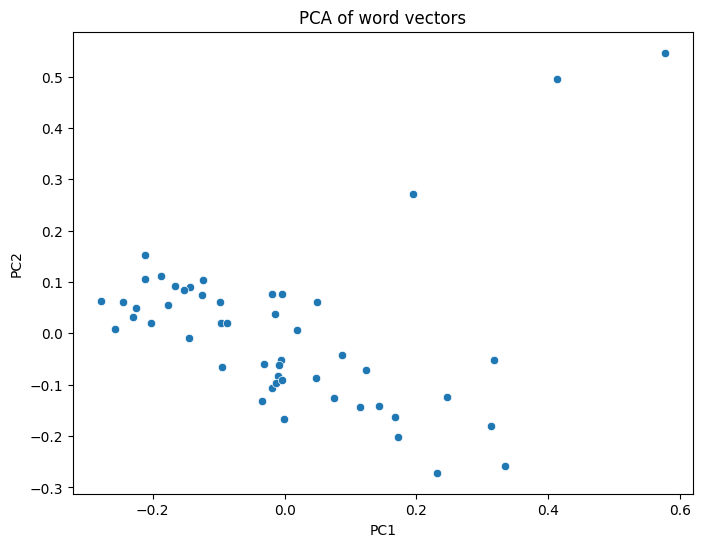

In [30]:
# Import tools.
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Reduce dimensions using PCA.
pca = PCA(n_components=2)
pca_result = pca.fit_transform(tfidf_df)
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])

# Visualization with PCA
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, palette='viridis')
plt.title('PCA of word vectors')
plt.show()
